## Data Basic Info

<pre>
      <h2> train_df (990, 194) </h2>
      Dep : id, species(99), (images by id)
      Indep : margin1 ~ texture 56
      
      
      <h2> test_df (594, 193) </h2>
      Dep : id
      Indep : margin1 ~ texture 56
      
      <h2> process and output </h2>
      Process : Make and optimize classification model
      Output : prediction of test_df
      
      AS csv file like
      
      id,Acer_Capillipes,Acer_Circinatum,Acer_Mono,...
      2,0.1,0.5,0,0.2,...
      5,0,0.3,0,0.4,...
      6,0,0,0,0.7,...
      etc. 
      
      <h2> Scored by logloss </h2>
       
</pre>

# Env Setting

In [21]:
# pd.set_option('display.height', 1000)
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
# pd.set_option('display.width', 1000)

# Importing Part

In [61]:
import numpy as np
import scipy as sp
import pandas as pd

import statsmodels.api as sm
import statsmodels.formula.api as smf
import statsmodels.stats.api as sms

import sklearn as sk
from sklearn import datasets
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn import metrics

import time
import matplotlib as mpl
import matplotlib.pylab as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

from sklearn.preprocessing import binarize
from sklearn.preprocessing import label_binarize
from sklearn.naive_bayes import GaussianNB, BernoulliNB, MultinomialNB
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, log_loss

######################################  Image contol  ######################################

import cv2
from IPython.core.display import Image, display

######################################       PCA      ######################################
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.decomposition import PCA

# Function Moduling Part

In [2]:
# encogin categorical values for further processing
def encode_cat(df):
    """
       Input : train_df 
       Output : encoded_train_df
    """
    # get categorical(type='object') variable
    cat_var_df = df.select_dtypes(include=['object']).copy()    
    
    cleanup_nums = {}
    
    # species columns encoding
    spe_index = 0
    spe_enc_dict = {}
    for key in set(cat_var_df['species'].values):
        spe_enc_dict[key] = spe_index
        spe_index += 1
    cleanup_nums['species'] = spe_enc_dict
    
    try:
        cat_var_df.replace(cleanup_nums, inplace=True)
    except:
        pass
    
    df = df.drop(cat_var_df.columns, axis=1)
    df = pd.concat([df, cat_var_df], axis=1)
    return df

# Data handling Part

In [70]:
train_df = pd.read_csv("../train.csv")
test_df = pd.read_csv("../test.csv")

# encoded('species') version of train_df
train_df_enc = encode_cat(train_df)
dfX = train_df_enc.drop(['id', 'species'], axis=1)
dfy = train_df_enc.loc[:, 'species']

# dfX scaled, standardized
dfX_minmax_scaled = pd.DataFrame(MinMaxScaler().fit_transform(dfX), columns=dfX.columns)
dfX_std_scaled = pd.DataFrame(StandardScaler().fit_transform(dfX), columns=dfX.columns)

In [6]:
print(train_df.shape)
print(test_df.shape)
print(len(train_df['species'].unique()))
print(dfX.shape)
print(dfy.shape)

(990, 194)
(594, 193)
99
(990, 192)
(990,)


In [ ]:
train_df.tail()

### Data description

In [22]:
dfX.describe() # need scaling for further analysis
               # show high variance in variable, but consider it natural characteristics rather than error

,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,margin10,margin11,margin12,margin13,margin14,margin15,margin16,margin17,margin18,margin19,margin20,margin21,margin22,margin23,margin24,margin25,margin26,margin27,margin28,margin29,margin30,margin31,margin32,margin33,margin34,margin35,margin36,margin37,margin38,margin39,margin40,margin41,margin42,margin43,margin44,margin45,margin46,margin47,margin48,margin49,margin50,margin51,margin52,margin53,margin54,margin55,margin56,margin57,margin58,margin59,margin60,margin61,margin62,margin63,margin64,shape1,shape2,shape3,shape4,shape5,shape6,shape7,shape8,shape9,shape10,shape11,shape12,shape13,shape14,shape15,shape16,shape17,shape18,shape19,shape20,shape21,shape22,shape23,shape24,shape25,shape26,shape27,shape28,shape29,shape30,shape31,shape32,shape33,shape34,shape35,shape36,shape37,shape38,shape39,shape40,shape41,shape42,shape43,shape44,shape45,shape46,shape47,shape48,shape49,shape50,shape51,shape52,shape53,shape54,shape55,shape56,shape57,shape58,shape59,shape60,shape61,shape62,shape63,shape64,texture1,texture2,texture3,texture4,texture5,texture6,texture7,texture8,texture9,texture10,texture11,texture12,texture13,texture14,texture15,texture16,texture17,texture18,texture19,texture20,texture21,texture22,texture23,texture24,texture25,texture26,texture27,texture28,texture29,texture30,texture31,texture32,texture33,texture34,texture35,texture36,texture37,texture38,texture39,texture40,texture41,texture42,texture43,texture44,texture45,texture46,texture47,texture48,texture49,texture50,texture51,texture52,texture53,texture54,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
count,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000
mean,0.017412,0.028539,0.031988,0.023280,0.014264,0.038579,0.019202,0.001083,0.007167,0.018639,0.024209,0.011975,0.041252,0.008053,0.015609,0.000110,0.015128,0.020107,0.012344,0.01

In [ ]:
train_df.tail()

### Data null checking

In [ ]:
print(train_df.isnull().sum().sort_values())
print(test_df.isnull().sum().sort_values())

### Data Type checking

id = int, species = object

In [ ]:
train_df_dtypes = train_df.dtypes.reset_index()
train_df_dtypes.columns = ["Count", "Column Type"]
train_df_dtypes.groupby("Column Type").aggregate('count').reset_index()

### Encoding 'Species (reference : Data handling part)

In [ ]:
train_df_enc[['species']]

## EDA

# modeling 1

log loss: 
4.20758632315
4.07969868003

In [65]:
classes = range(len(dfy.unique()))

model1 = MultinomialNB().fit(dfX, dfy)
y1_pred = model1.predict(dfX)
model1_probs = model1.predict_proba(dfX)
score1 = log_loss(dfy, model1_probs)

model2 = LogisticRegression().fit(dfX, dfy)
y2_pred = model2.predict(dfX)
model2_probs = model2.predict_proba(dfX)
score2 = log_loss(dfy, model2_probs)

print(confusion_matrix(dfy, y1_pred))
print(classification_report(dfy, y1_pred))

print(confusion_matrix(dfy, y2_pred))
print(classification_report(dfy, y2_pred))

print(score1)
print(score2)


# ROC Visualization
# for i in classes:
#     fpr, tpr, thresholds = roc_curve(y1_pred[:, i], model1_probs[:, i])
#     plt.plot(fpr, tpr, label="class {}".format(i))

# plt.legend()
# plt.show()

[[10  0  0 ...,  0  0  0]
 [ 0  9  0 ...,  0  1  0]
 [ 0  0  4 ...,  0  2  0]
 ..., 
 [ 0  0  0 ..., 10  0  0]
 [ 0  0  0 ...,  0 10  0]
 [ 0  0  0 ...,  0  0 10]]
             precision    recall  f1-score   support

          0       0.77      1.00      0.87        10
          1       0.82      0.90      0.86        10
          2       1.00      0.40      0.57        10
          3       0.40      0.80      0.53        10
          4       1.00      0.80      0.89        10
          5       1.00      0.90      0.95        10
          6       0.46      0.60      0.52        10
          7       0.91      1.00      0.95        10
          8       0.26      1.00      0.41        10
          9       0.67      0.60      0.63        10
         10       1.00      0.60      0.75        10
         11       1.00      0.70      0.82        10
         12       0.75      0.90      0.82        10
         13       1.00      0.10      0.18        10
         14       0.73      0.80      0.

/home/dockeruser/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


# modeling 2 : scaled or standardized
minmaxscale for Multinomial NB, std for logistic regre

logloss : 
0.41573029257
0.547306380601

In [68]:
classes = range(len(dfy.unique()))

model1 = MultinomialNB().fit(dfX_minmax_scaled, dfy)
y1_pred = model1.predict(dfX_minmax_scaled)
model1_probs = model1.predict_proba(dfX_minmax_scaled)
score1 = log_loss(dfy, model1_probs)

model2 = LogisticRegression().fit(dfX_std_scaled, dfy)
y2_pred = model2.predict(dfX_std_scaled)
model2_probs = model2.predict_proba(dfX_std_scaled)
score2 = log_loss(dfy, model2_probs)

print(confusion_matrix(dfy, y1_pred))
print(classification_report(dfy, y1_pred))

print(confusion_matrix(dfy, y2_pred))
print(classification_report(dfy, y2_pred))

print(score1)
print(score2)

[[10  0  0 ...,  0  0  0]
 [ 0 10  0 ...,  0  0  0]
 [ 0  0 10 ...,  0  0  0]
 ..., 
 [ 0  0  0 ..., 10  0  0]
 [ 0  0  0 ...,  0 10  0]
 [ 0  0  0 ...,  0  0 10]]
             precision    recall  f1-score   support

          0       0.91      1.00      0.95        10
          1       1.00      1.00      1.00        10
          2       1.00      1.00      1.00        10
          3       1.00      1.00      1.00        10
          4       1.00      1.00      1.00        10
          5       1.00      1.00      1.00        10
          6       1.00      1.00      1.00        10
          7       1.00      1.00      1.00        10
          8       1.00      1.00      1.00        10
          9       1.00      0.90      0.95        10
         10       1.00      1.00      1.00        10
         11       1.00      1.00      1.00        10
         12       1.00      1.00      1.00        10
         13       1.00      1.00      1.00        10
         14       1.00      1.00      1.

In [4]:
# source : https://stackoverflow.com/questions/22219004/grouping-rows-in-list-in-pandas-groupby
g = train_df.loc[:, ['id', 'species']].groupby("species")['id'].apply(list).reset_index()
g['counts'] = train_df.loc[:, ['species']].groupby('species').size().values
g

,species,id,counts
0,Acer_Capillipes,"[201, 227, 498, 569, 610, 990, 1196, 1377, 152...",10
1,Acer_Circinatum,"[160, 164, 166, 235, 268, 496, 962, 1000, 1019...",10
2,Acer_Mono,"[216, 288, 489, 499, 807, 892, 1005, 1342, 151...",10
3,Acer_Opalus,"[1, 317, 906, 1002, 1125, 1159, 1270, 1320, 14...",10
4,Acer_Palmatum,"[27, 118, 203, 324, 960, 1041, 1085, 1088, 137...",10
5,Acer_Pictum,"[146, 311, 362, 810, 915, 949, 956, 1417, 1538...",10
6,Acer_Platanoids,"[38, 322, 331, 408, 511, 589, 754, 1011, 1467,...",10
7,Acer_Rubrum,"[238, 698, 727, 873, 1117, 1154, 1165, 1216, 1...",10
8,Acer_Rufinerve,"[148, 364, 404, 570, 641, 651, 652, 713, 853, ...",10
9,Acer_Saccharinum,"[78, 167, 253, 365, 506, 763, 864, 1003, 1182,...",10


# image visualization

In [5]:
index = 0
plt.figure(figsize=(60, 60))
for row in range(index*20, (index+1)*20):
    for col in range(10):
        plt.subplot(20, 10, (row-index*20)*10+col+1)
        img = cv2.imread('../images/{}.jpg'.format(g.iloc[row, 1][col]))
        plt.axis("off")
        plt.imshow(img)

In [7]:
index = 1
plt.figure(figsize=(60, 60))
for row in range(index*20, (index+1)*20):
    for col in range(10):
        plt.subplot(20, 10, (row-index*20)*10+col+1)
        img = cv2.imread('../images/{}.jpg'.format(g.iloc[row, 1][col]))
        plt.axis("off")
        plt.imshow(img)

In [9]:
index = 2
plt.figure(figsize=(60, 60))
for row in range(index*20, (index+1)*20):
    for col in range(10):
        plt.subplot(20, 10, (row-index*20)*10+col+1)
        img = cv2.imread('../images/{}.jpg'.format(g.iloc[row, 1][col]))
        plt.axis("off")
        plt.imshow(img)

In [10]:
index = 3
plt.figure(figsize=(60, 60))
for row in range(index*20, (index+1)*20):
    for col in range(10):
        plt.subplot(20, 10, (row-index*20)*10+col+1)
        img = cv2.imread('../images/{}.jpg'.format(g.iloc[row, 1][col]))
        plt.axis("off")
        plt.imshow(img)

In [11]:
index = 4
plt.figure(figsize=(60, 60))
for row in range(index*20, (index+1)*20):
    for col in range(10):
        plt.subplot(20, 10, (row-index*20)*10+col+1)
        img = cv2.imread('../images/{}.jpg'.format(g.iloc[row, 1][col]))
        plt.axis("off")
        plt.imshow(img)

IndexError: single positional indexer is out-of-bounds

# Principal Components Analysis

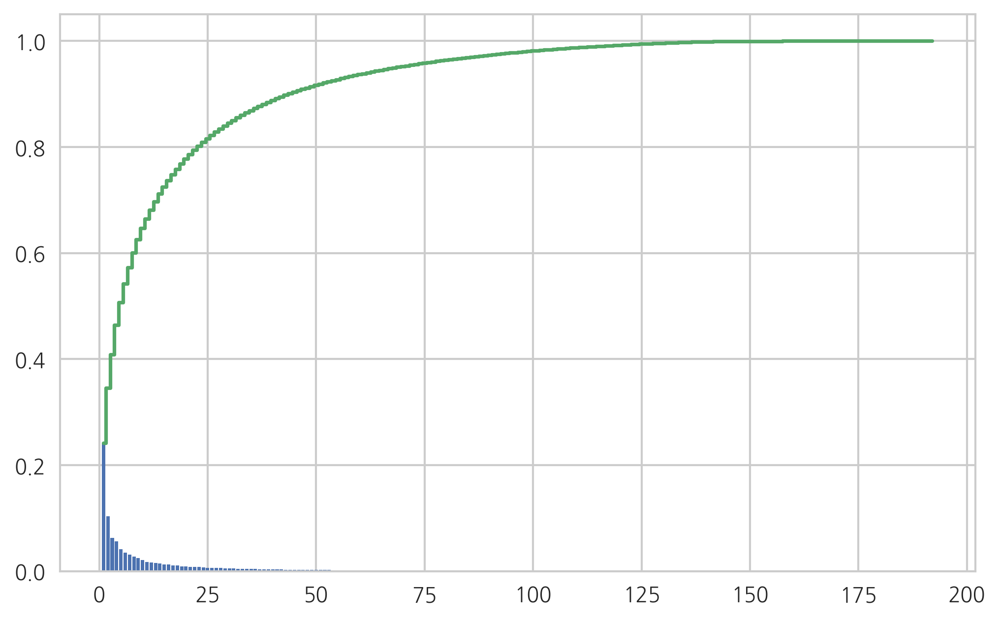

In [72]:
# source : https://datascienceschool.net/view-notebook/f10aad8a34a4489697933f77c5d58e3a/
pca = PCA().fit(dfX_std_scaled)
var = pca.explained_variance_
cmap = sns.color_palette()
plt.bar(np.arange(1,len(var)+1), var/np.sum(var), align="center", color=cmap[0])
plt.step(np.arange(1,len(var)+1), np.cumsum(var)/np.sum(var), where="mid", color=cmap[1])
plt.show()

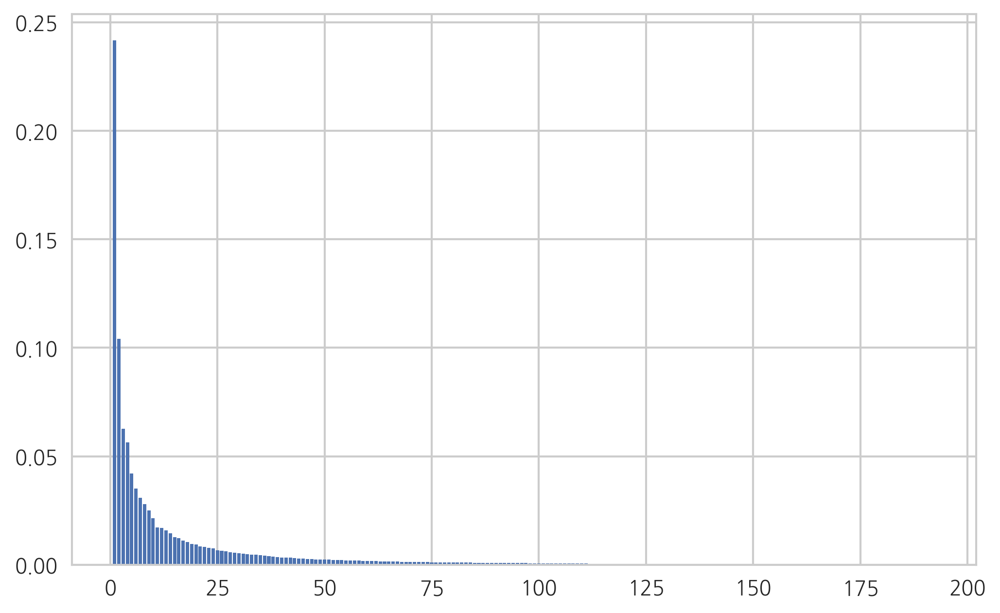

In [73]:
cmap = sns.color_palette()
plt.bar(np.arange(1,len(var)+1), var/np.sum(var), align="center", color=cmap[0])
plt.show()

In [84]:
pca1 = PCA(n_components=40).fit(dfX_std_scaled)
Z_df = pd.DataFrame(pca1.transform(dfX_std_scaled), columns=range(40))
Z_df.shape

(990, 40)

In [37]:
dfX_scaled.describe()

,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,margin10,margin11,margin12,margin13,margin14,margin15,margin16,margin17,margin18,margin19,margin20,margin21,margin22,margin23,margin24,margin25,margin26,margin27,margin28,margin29,margin30,margin31,margin32,margin33,margin34,margin35,margin36,margin37,margin38,margin39,margin40,margin41,margin42,margin43,margin44,margin45,margin46,margin47,margin48,margin49,margin50,margin51,margin52,margin53,margin54,margin55,margin56,margin57,margin58,margin59,margin60,margin61,margin62,margin63,margin64,shape1,shape2,shape3,shape4,shape5,shape6,shape7,shape8,shape9,shape10,shape11,shape12,shape13,shape14,shape15,shape16,shape17,shape18,shape19,shape20,shape21,shape22,shape23,shape24,shape25,shape26,shape27,shape28,shape29,shape30,shape31,shape32,shape33,shape34,shape35,shape36,shape37,shape38,shape39,shape40,shape41,shape42,shape43,shape44,shape45,shape46,shape47,shape48,shape49,shape50,shape51,shape52,shape53,shape54,shape55,shape56,shape57,shape58,shape59,shape60,shape61,shape62,shape63,shape64,texture1,texture2,texture3,texture4,texture5,texture6,texture7,texture8,texture9,texture10,texture11,texture12,texture13,texture14,texture15,texture16,texture17,texture18,texture19,texture20,texture21,texture22,texture23,texture24,texture25,texture26,texture27,texture28,texture29,texture30,texture31,texture32,texture33,texture34,texture35,texture36,texture37,texture38,texture39,texture40,texture41,texture42,texture43,texture44,texture45,texture46,texture47,texture48,texture49,texture50,texture51,texture52,texture53,texture54,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
count,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000
mean,0.198113,0.139162,0.204722,0.137003,0.128121,0.124229,0.209176,0.034657,0.094093,0.190869,0.193671,0.227086,0.106137,0.098172,0.242179,0.007071,0.249852,0.087989,0.098753,0.24

In [17]:
Z = pca.transform(dfX)
Z.shape

(990, 192)

In [14]:
pca.components_

array([[  7.69279097e-02,   1.67920672e-01,  -8.17361067e-04, ...,
         -1.46648454e-01,  -1.87680537e-02,   2.69715710e-02],
       [  1.28726219e-01,   2.74674706e-01,  -4.25059911e-02, ...,
          1.38267298e-01,  -1.84807000e-02,  -6.13525792e-02],
       [ -6.69266305e-02,  -1.07396767e-01,  -2.93159955e-02, ...,
          1.38853419e-01,  -1.54151640e-02,  -1.13421922e-01],
       ..., 
       [  9.98680887e-05,   1.91386495e-04,   1.35884081e-04, ...,
         -3.84004429e-04,  -3.49229596e-04,  -4.00630340e-04],
       [ -6.48594084e-05,  -6.41864809e-05,  -6.52654218e-05, ...,
          1.24994698e-01,   1.24993630e-01,   1.24994804e-01],
       [ -1.24996325e-01,  -1.24996949e-01,  -1.24996451e-01, ...,
         -6.24245846e-05,  -6.22880616e-05,  -6.23854760e-05]])

In [41]:
dfX.proportion

AttributeError: 'DataFrame' object has no attribute 'proportion'